In [1]:
from glob import glob
import xarray as xr
import pandas as pd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs

from os.path import basename, isfile
from datetime import datetime
import calendar
import numpy as np
import matplotlib.dates as mdates
import matplotlib.patches as mpatches
import cartopy.feature as cfeature
import warnings
warnings.filterwarnings('ignore')

from dask.diagnostics import ProgressBar

In [2]:
def add_time_dim(ds):
    ds = ds.expand_dims(time = [datetime.now()])
    return ds

def extract_reg(da, r):
    print(f'Extracting {r}:')
    if da.lon.min() >= 0:
        da = roll_lon(da)
    if r[0]>r[1]:
        left = xr.ones_like(da).where((da.lon>=r[0]) & (da.lon<=180),0)
        right = xr.ones_like(da).where( (da.lon>=-180) & (da.lon <=r[1]),0)
        da = da.where(left+right!=0)
    else:
        da = da.where((da.lon>=r[0]) & (da.lon<=r[1]))
    da = da.where((da.lat>=r[2]) & (da.lat<=r[3]), drop=True)
    return da

def weighted_spatial_mean(da):
    coslat = np.cos(np.deg2rad(da.lat))
    wda = da.weighted(coslat)
    return wda.mean(['lon', 'lat'])

## Setup

In [3]:
# Modify the path to the dataset
data_path = '/discover/nobackup/lren1/pre_proc/NRT/SMOS/RAW/L32Q'

# Select year
y =2015

# Choose output path
opath = './'

# Define regions of interest

regions = {
    'Ni4'   : [160, -150, -5, 5],
    'Ni3.4' : [-170, -120, -5, 5],
    'Ni3'   : [-150, -90, -5, 5],
    'Ni12'  : [ -90, -80, -10, 0],
}


## Load SMOS data

In [4]:
fname = f'{opath}/smos_obs_AD_{y}.nc'

if not isfile(fname):
    Afiles = glob(f'{data_path}/{y}/*/SM_RE07_MIR_CSF2QA_{y}*_331_001_7.DBL.nc')
    Afiles.sort()
    Dfiles = glob(f'{data_path}/{y}/*/SM_RE07_MIR_CSF2QD_{y}*_331_001_7.DBL.nc')
    Dfiles.sort()

    Atimes = xr.DataArray([pd.to_datetime(basename(f).split('_')[4]) for f in Afiles], name='time', dims='time')
    Dtimes = xr.DataArray([pd.to_datetime(basename(f).split('_')[4]) for f in Dfiles], name='time', dims='time')

    ds_A = xr.open_mfdataset(Afiles, preprocess = add_time_dim, )
    ds_A['time'] = Atimes

    ds_D = xr.open_mfdataset(Dfiles, preprocess = add_time_dim, )
    ds_D['time'] = Dtimes

    vnames = ['Sea_Surface_Salinity', 'Sea_Surface_Salinity_Rain_Corrected']
    ds = ds_A.combine_first(ds_D)

    # QC
    for v in vnames:
        ds[v] = ds[v].where(ds[v]>=0)

    ds['SSS_dif'] = ds['Sea_Surface_Salinity_Rain_Corrected'] - ds['Sea_Surface_Salinity']
    dl = ds.to_netcdf(f'smos_obs_AD_{y}.nc', compute=False)
    with ProgressBar():
        dl = dl.compute()

ds = xr.open_dataset(fname)

In [6]:
ds

<xarray.Dataset>
Dimensions:                                              (time: 365, lat: 584,
                                                          lon: 1388)
Coordinates:
  * time                                                 (time) datetime64[ns] ...
  * lat                                                  (lat) float32 -83.52...
  * lon                                                  (lon) float32 -179.9...
Data variables: (12/16)
    Grid_point_ID                                        (time, lat, lon) float64 ...
    Sea_Surface_Salinity                                 (time, lat, lon) float32 ...
    Sea_Surface_Salinity_Rain_Corrected                  (time, lat, lon) float32 ...
    Acard                                                (time, lat, lon) float32 ...
    Sea_Surface_Salinity_Error                           (time, lat, lon) float32 ...
    Sea_Surface_Salinity_Bias_Correction                 (time, lat, lon) float32 ...
    ...                                                   ...
    Acard_Error                                          (time, lat, lon) float32 ...
    Acard_Bias                                           (time, lat, lon) float32 ...
    X_Swath                                              (time, lat, lon) float32 ...
    Mean_Acq_Time                                        (time, lat, lon) datetime64[ns] ...
    Sea_Surface_Salinity_QC                              (time, lat, lon) float32 ...
    SSS_dif                                              (time, lat, lon) float32 ...
Attributes: (12/22)
    title:              SMOS CATDS Qualified (L2Q) Sea Surface Salinity product
    Conventions:        CF-1.8
    netcdf_version_id:  3.6.2
    creation_date:      2022/06/16
    product_version:    1.0
    institution:        SMOS CATDS (www.catds.fr)
    ...                 ...
    srid:               EPSG:6933
    proj4text:          +proj=cea +lon_0=0 +lat_ts=30 +x_0=0 +y_0=0 +ellps=WG...
    DOI:                10.12770/12dba510-cd71-4d4f-9fc1-9cc027d128b0
    DOI_link:           https://doi.org/10.12770/12dba510-cd71-4d4f-9fc1-9cc0...
    citation:           CATDS (2019). CATDS-PDC L3OS 2Q - Debiased daily vali...
    publication:        In addition to properly cite this dataset, it would b...

## Extract regions

In [7]:
nireg = extract_reg(ds, regions['Ni3.4']).dropna('lon', how='all')
mnireg = nireg['SSS_dif'].mean(['lon', 'lat'])

Extracting [-170, -120, -5, 5]:


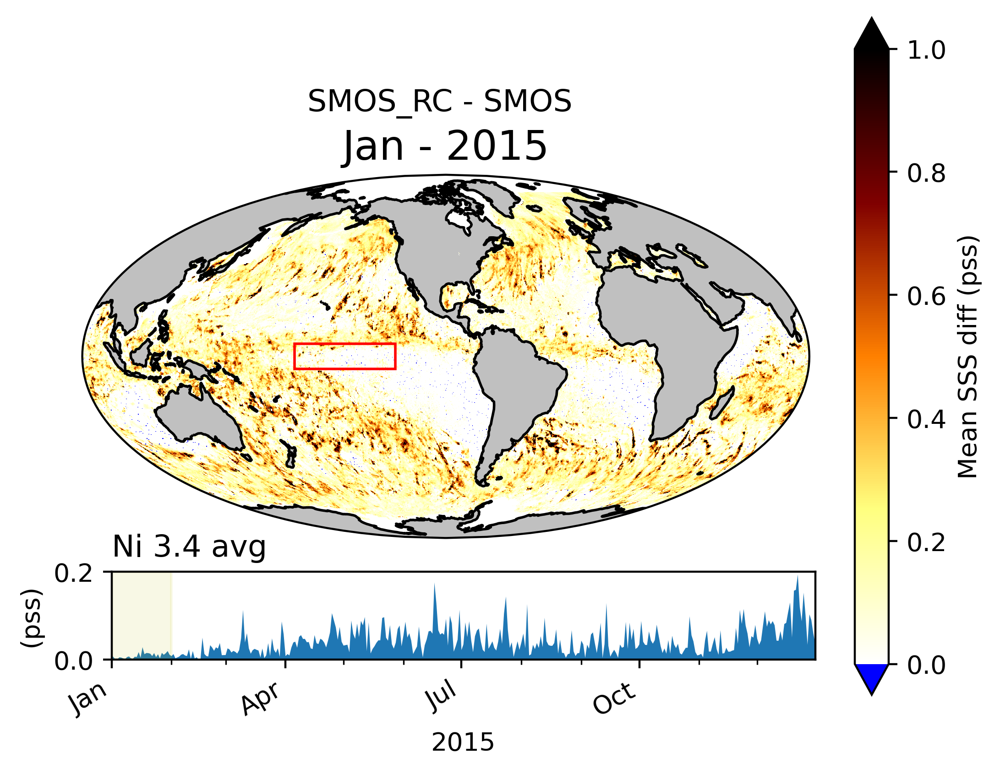

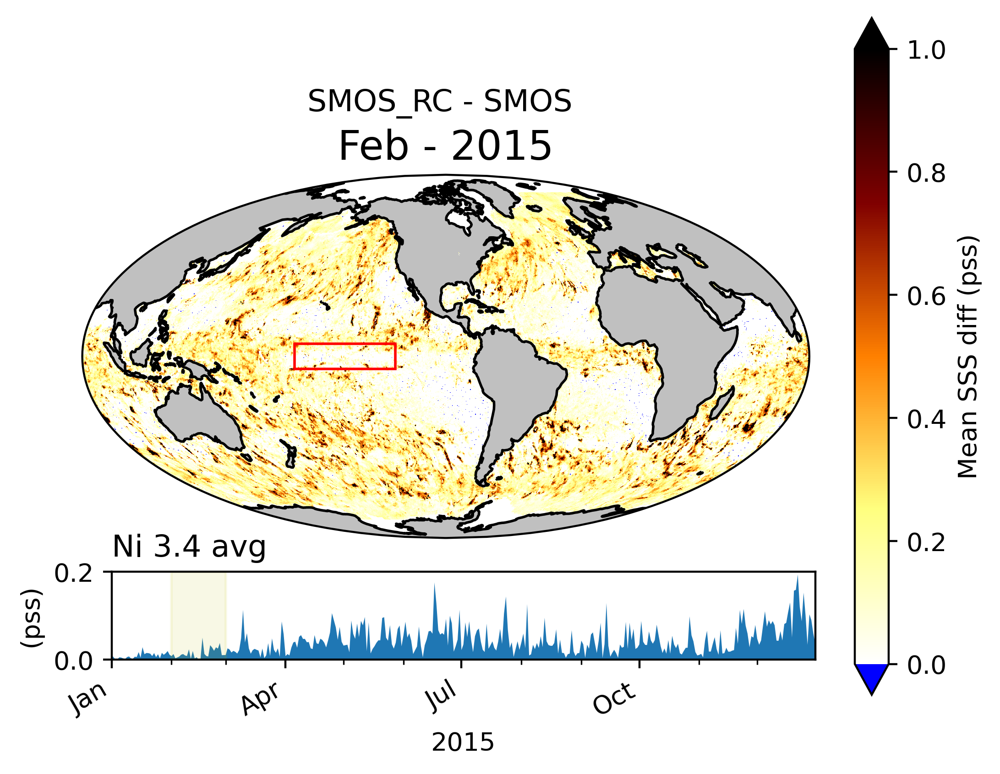

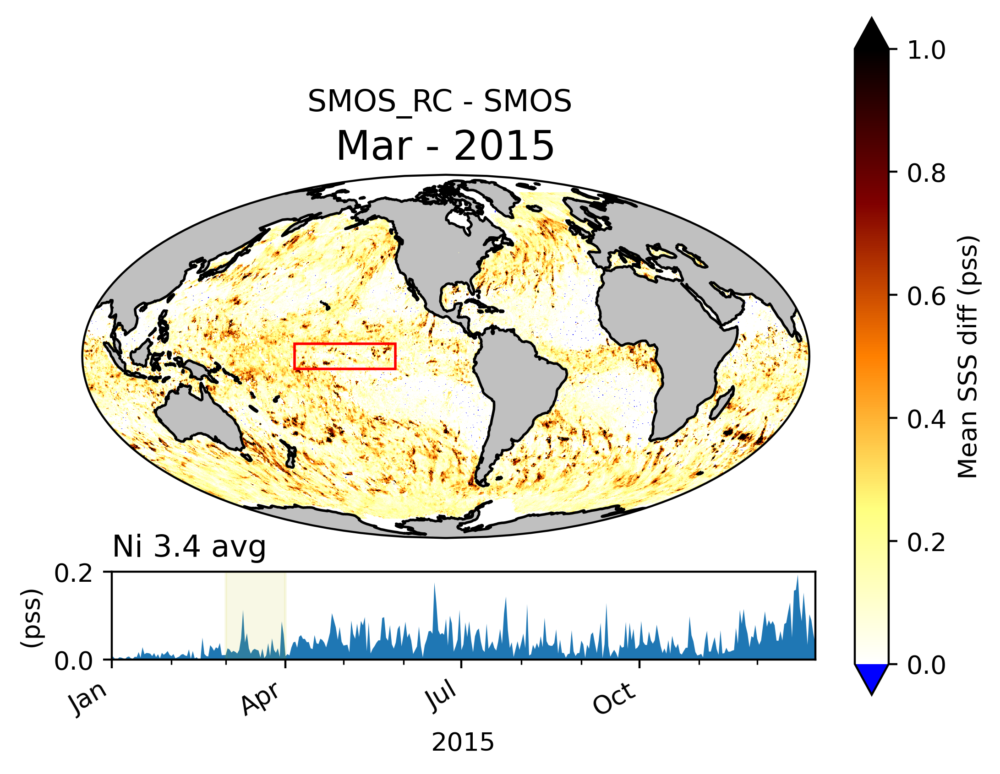

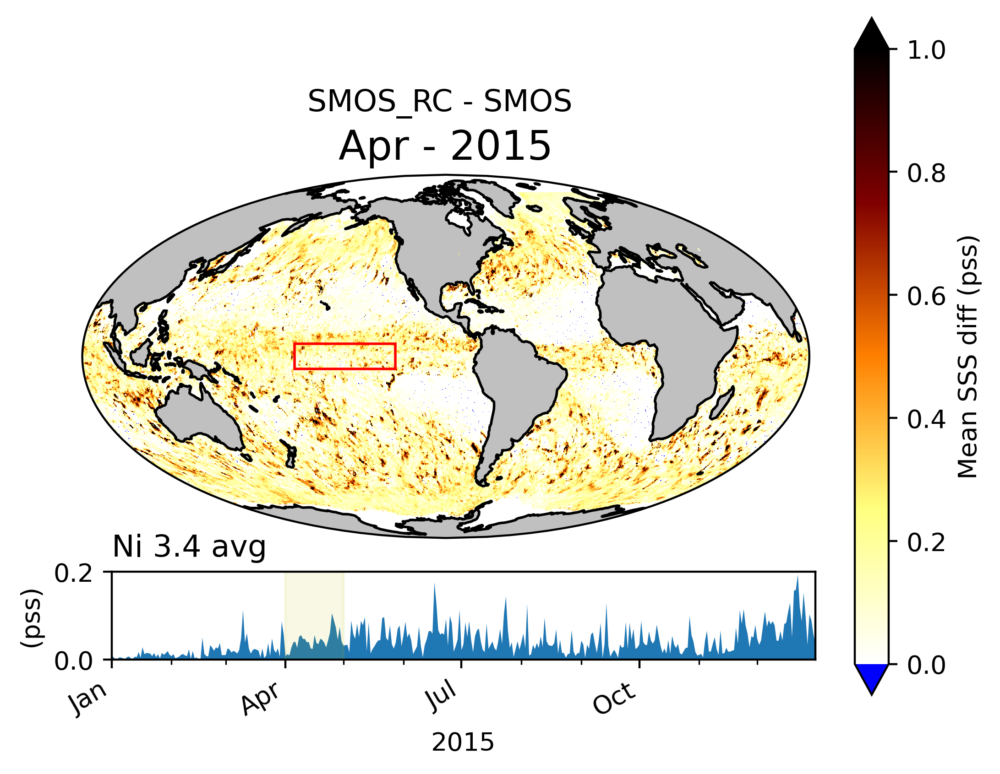

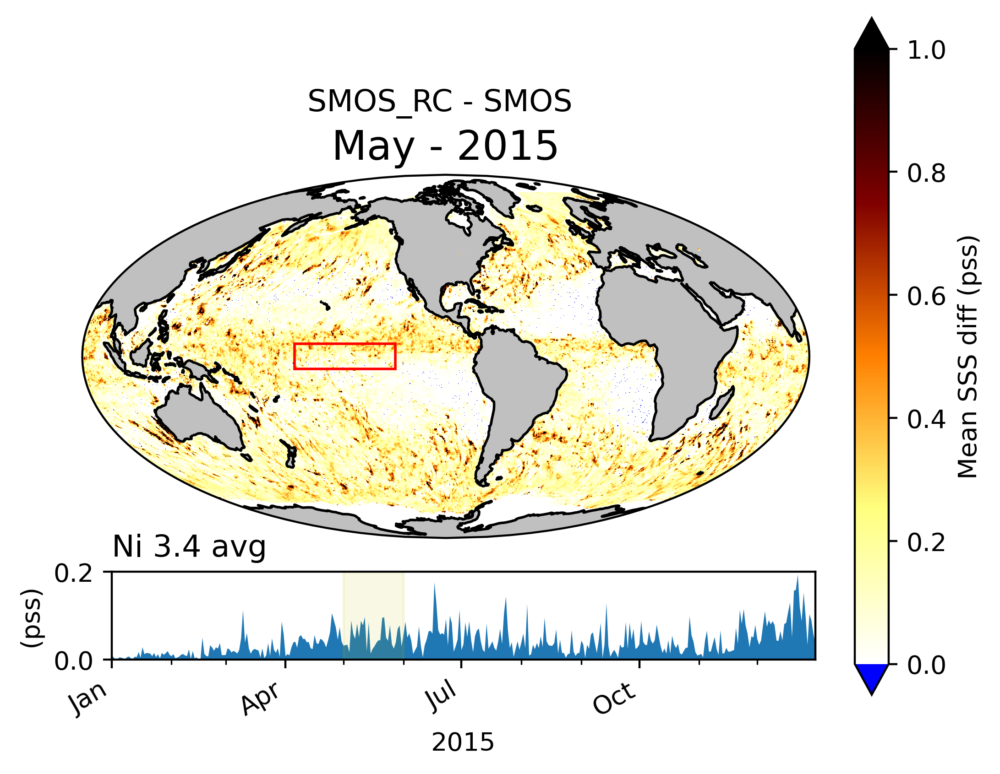

...

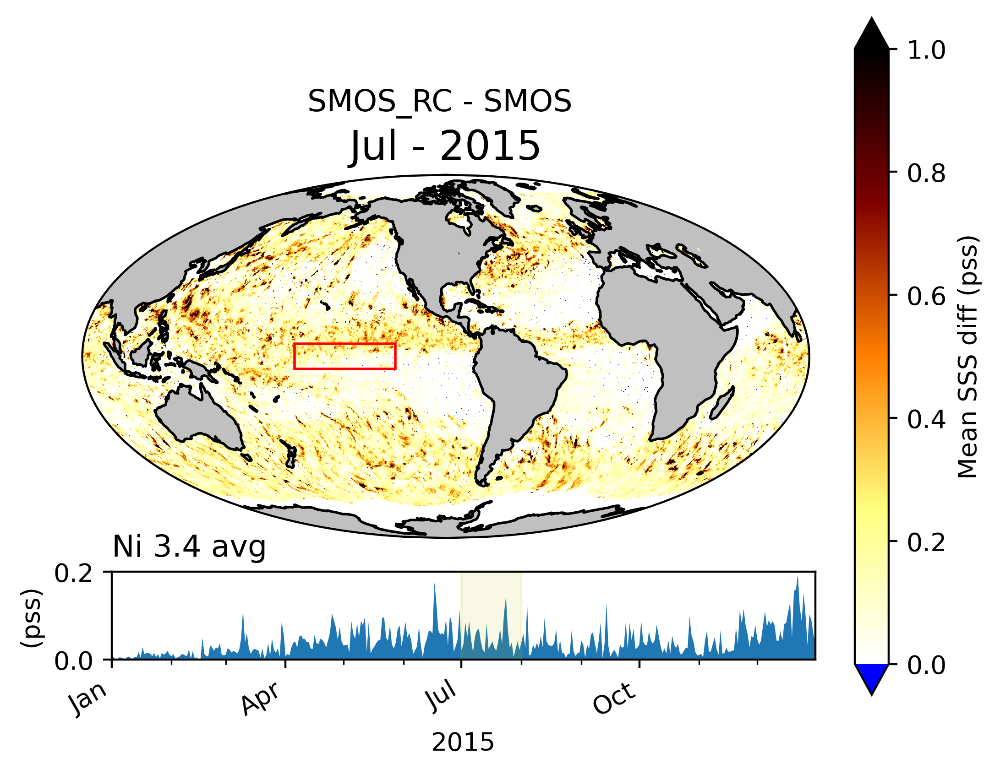

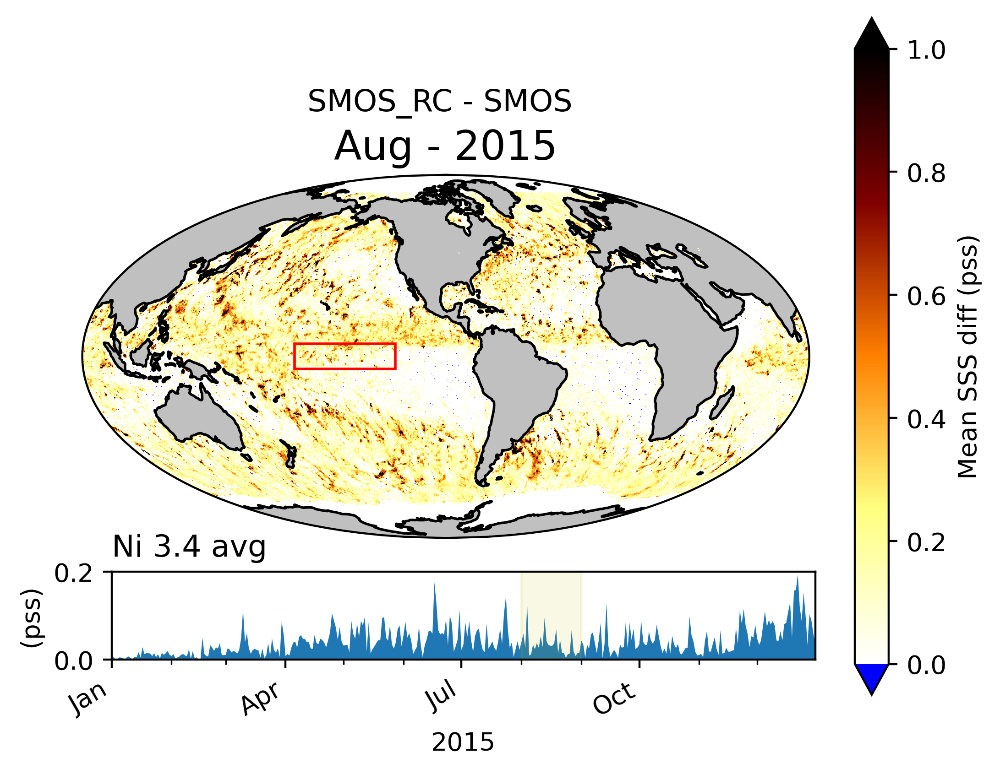

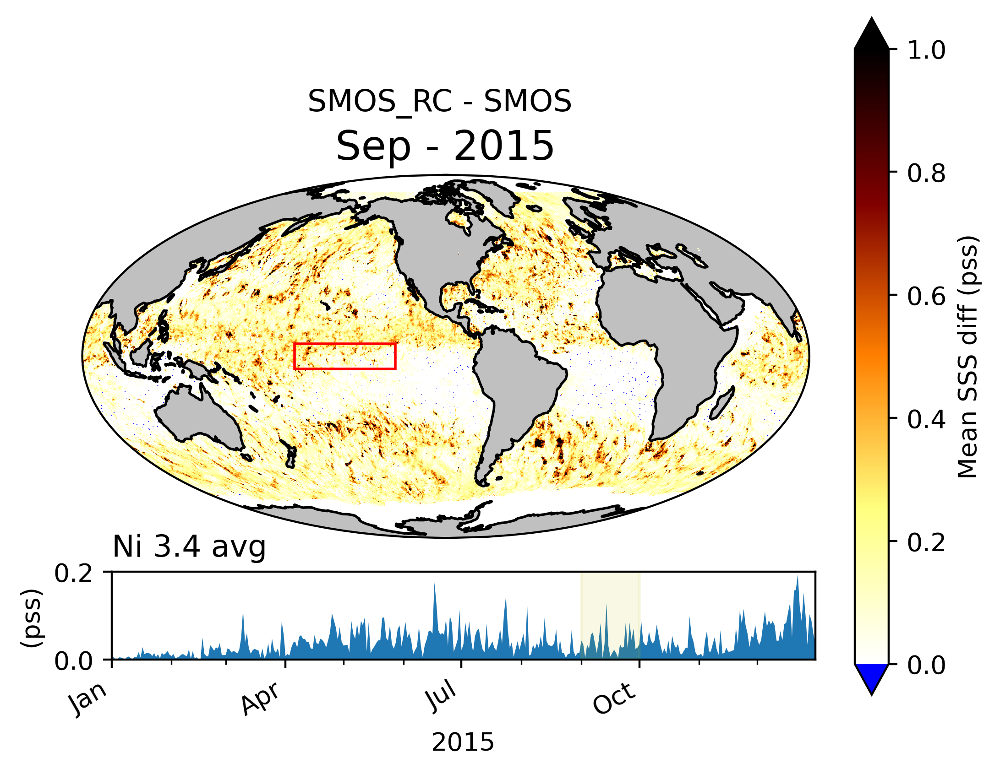

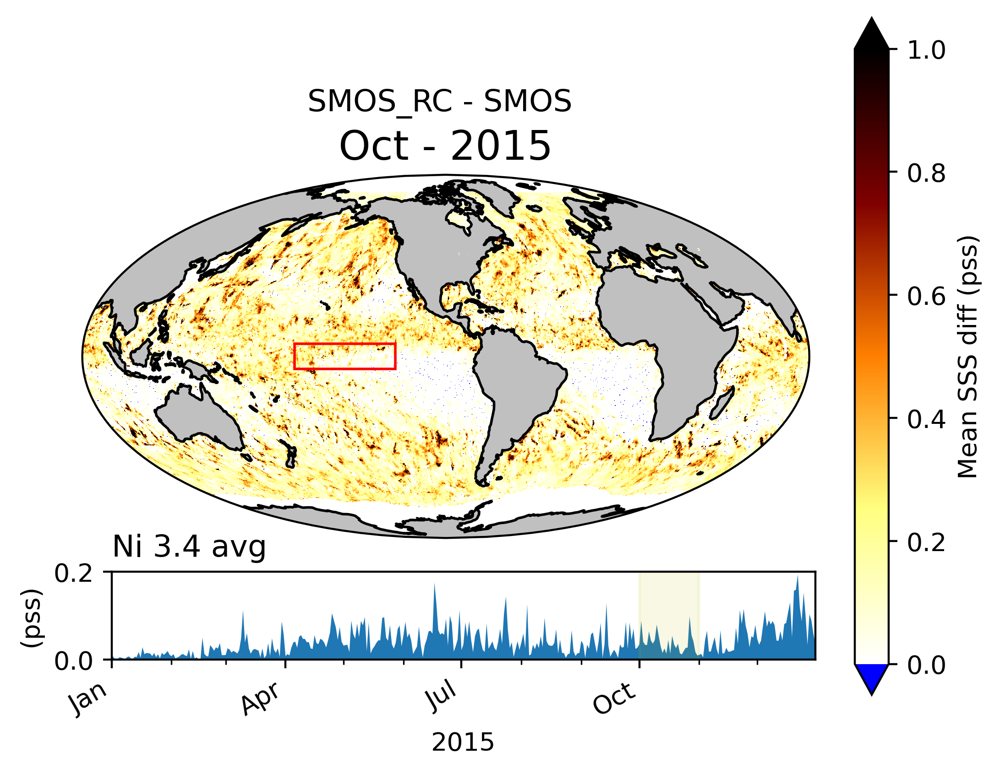

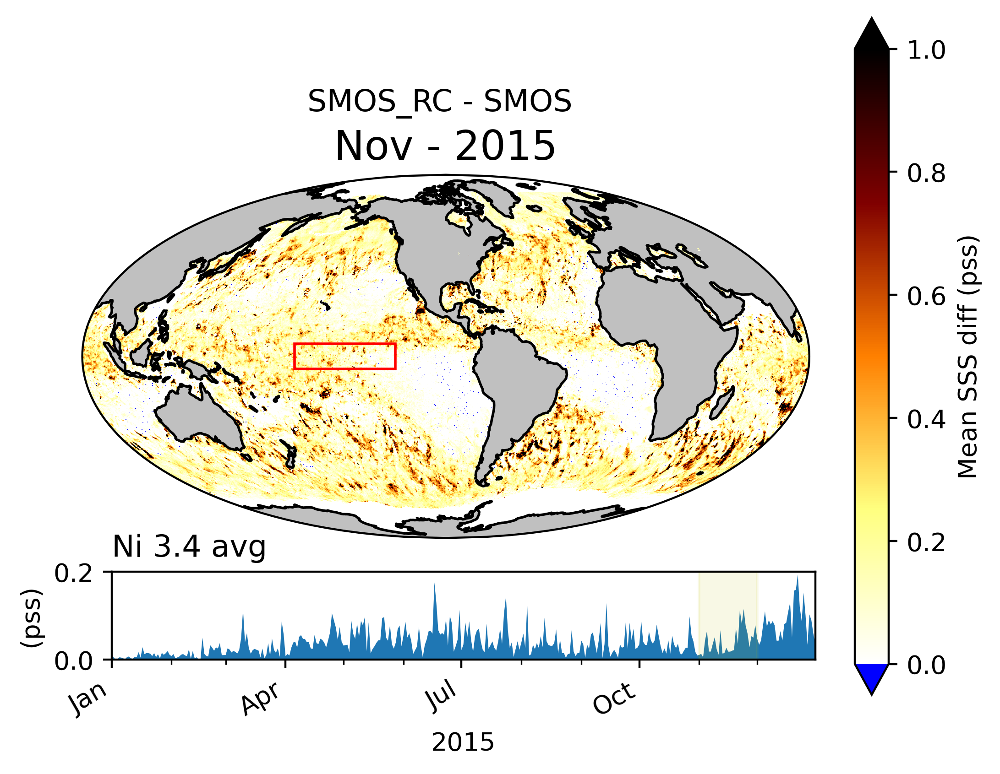

In [10]:
lat = 75
cmap = plt.get_cmap('afmhot_r')
cmap.set_extremes(under='blue')

for m in range(1,12):
    SSS_dif = ds['SSS_dif'].sel(time=f'{y}-{m:02d}', lat=slice(-lat, lat))
    SSS_dif = SSS_dif.where(SSS_dif!=0)

    fig, ax = plt.subplots(dpi=400,
                             subplot_kw={'projection': ccrs.Mollweide(central_longitude=-95)})
    SSS_dif.mean('time').plot(x='lon', y='lat', ax=ax, transform=ccrs.PlateCarree(),
                              vmin=0, vmax=1,
                              cmap = cmap,
                              cbar_kwargs={'label': 'Mean SSS diff (pss)', 'extend': 'both'},
                             )
    ax.add_feature(cfeature.LAND, facecolor="silver")
    ax.coastlines()
    ax.set_global()
    ax.set_title(f'{calendar.month_abbr[m]} - {y}', size=16)

    ax.add_patch(mpatches.Rectangle(xy=[-170, -5], width=50, height=10,
                                    facecolor='none', edgecolor='red',
                                    transform=ccrs.PlateCarree()))

    inset = fig.add_axes([0.15,0.15, .6, 0.1])
    inset.fill_between(mnireg.time, mnireg, 0,)
    inset.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%b'))
    inset.xaxis.set_major_locator(mdates.MonthLocator(interval=3))
    inset.xaxis.set_minor_locator(mdates.MonthLocator())
    inset.xaxis.set_major_formatter(mdates.DateFormatter('%b'))
    for label in inset.get_xticklabels(which='major'):
        label.set(rotation=30, horizontalalignment='right')

    inset.set_ylabel('(pss)')
    inset.set_xlabel(f'{y}')
    inset.set_xlim(mnireg.time[0], mnireg.time[-1])
    inset.set_ylim(0, .2)
    inset.set_title('Ni 3.4 avg', loc='left')

    inset.axvspan(pd.to_datetime(f'{y}-{m:02d}-01'), pd.to_datetime(f'{y}-{m+1:02d}-01'), color='y', alpha=0.1)

    fig.suptitle('SMOS_RC - SMOS', y=.8, x=.43)
    fig.savefig(f'{opath}/SSS_dif_SMOSmRC_{y}{m:02d}.png')

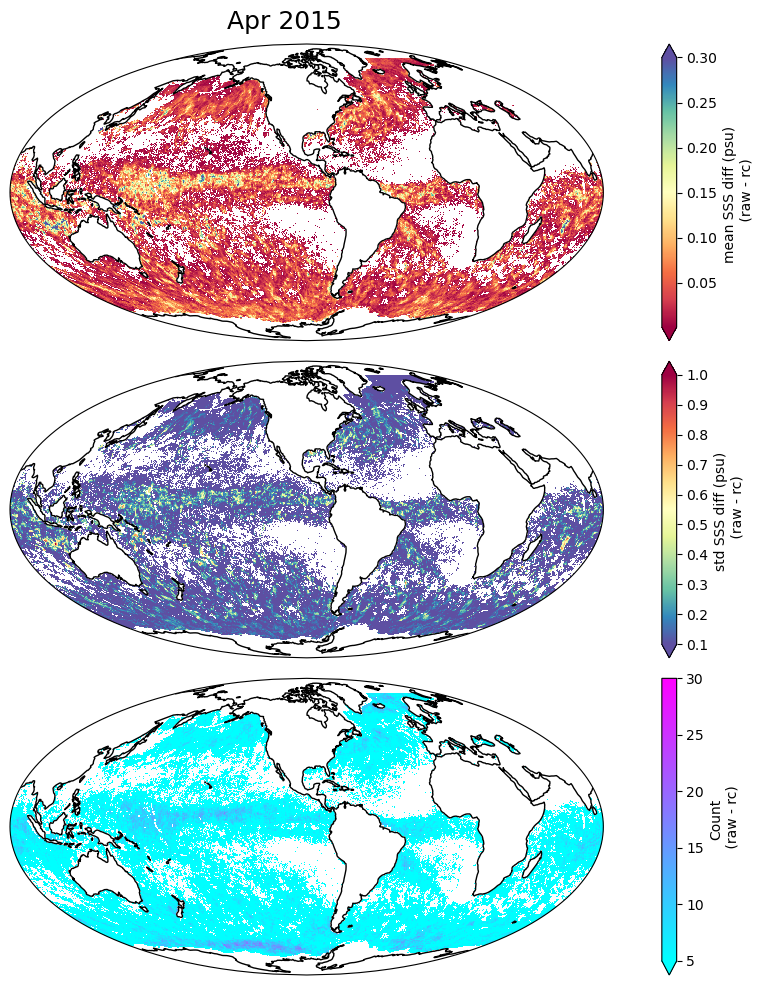

In [14]:
m =4
SSS_dif = ds['SSS_dif'].sel(time=f'{y}-{m:02d}', lat=slice(-lat, lat))

fig, axes = plt.subplots(3,1, figsize=(12,10),
                         subplot_kw={'projection': ccrs.Mollweide(central_longitude=-95)})

th = .001
count = SSS_dif.where(SSS_dif>th).count('time')

SSS_dif.where(count>1).mean('time').plot(x='lon', y='lat', ax=axes[0], 
            transform=ccrs.PlateCarree(),
            vmin=.001,vmax=.3, 
            cmap = 'Spectral',
            cbar_kwargs={'label': 'mean SSS diff (psu) \n (raw - rc)',}
          )

SSS_dif.where(count>1).std('time').plot(x='lon', y='lat', ax=axes[1], 
            transform=ccrs.PlateCarree(),
            vmin=.1, vmax=1,
            cmap = 'Spectral_r',
            cbar_kwargs={'label': 'std SSS diff (psu) \n (raw - rc)',}
          )

count.where(count>1).plot(x='lon', y='lat', ax=axes[2], 
            transform=ccrs.PlateCarree(),
            vmin=5, vmax=30,
            cmap = 'cool',
            cbar_kwargs={'label': 'Count\n (raw - rc)',}
          )

for ax in axes.flatten():
    ax.coastlines()
    ax.set_global()
    
fig.suptitle(f'        {calendar.month_abbr[m]} {y}', size=18)
fig.tight_layout()